**<center><font size=5>Brain Tumor Detection with Transefer Learning </font></center>**


In [ ]:
# Install imutils and import pre-trained models with correct preprocess_input

from IPython.display import clear_output
!pip install imutils
clear_output()

from keras.applications.vgg19 import VGG19, preprocess_input as vgg19_preprocess
from keras.applications.xception import Xception, preprocess_input as xception_preprocess
from keras.applications.inception_v3 import InceptionV3, preprocess_input as inception_preprocess
from keras.applications.resnet50 import ResNet50, preprocess_input as resnet50_preprocess

In [ ]:
# Import all necessary libraries for image preprocessing, modeling, evaluation, and visualization

import numpy as np 
from tqdm import tqdm
import cv2
import os
import shutil
import itertools
import imutils
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16, preprocess_input
from keras import layers
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping

init_notebook_mode(connected=True)
RANDOM_SEED = 123

Right now all images are in one folder with `yes` and `no` subfolders. I will split the data into `train`, `val` and `test` folders which makes its easier to work for me. The new folder heirarchy will look as follows:

In [ ]:
# Install tree utility and create directory structure for training, testing, and validation

!apt-get install -y tree
!mkdir -p TRAIN/YES TRAIN/NO TEST/YES TEST/NO VAL/YES VAL/NO
!tree -d

zsh:1: command not found: apt-get
.
├── TEST
│   ├── NO
│   └── YES
├── TRAIN
│   ├── NO
│   └── YES
├── VAL
│   ├── NO
│   └── YES
├── brain_tumor_dataset
│   ├── no
│   └── yes
├── image-caption-generator-master
│   ├── flicker_30k
│   ├── static
│   │   └── images
│   ├── templates
│   └── web images
└── python-project-image-caption-generator
    └── models

21 directories


In [6]:
# Split brain tumor dataset into TRAIN, TEST, and VAL folders with image copying

IMG_PATH = 'brain_tumor_dataset/'

# split the data by train/val/test
for CLASS in os.listdir(IMG_PATH):
    if not CLASS.startswith('.'):
        class_path = os.path.join(IMG_PATH, CLASS)
        images = os.listdir(class_path)
        IMG_NUM = len(images)
        for n, FILE_NAME in enumerate(images):
            img = os.path.join(class_path, FILE_NAME)
            if n < 5:
                shutil.copy(img, f'TEST/{CLASS.upper()}/{FILE_NAME}')
            elif n < int(0.8 * IMG_NUM):
                shutil.copy(img, f'TRAIN/{CLASS.upper()}/{FILE_NAME}')
            else:
                shutil.copy(img, f'VAL/{CLASS.upper()}/{FILE_NAME}')

# <a id='import'>3. Data Import and Preprocessing</a>

In [7]:
# Functions to load image data and visualize the confusion matrix

def load_data(dir_path, img_size=(100, 100)):
    """
    Load resized images as np.arrays to workspace
    """
    X = []
    y = []
    i = 0
    labels = dict()
    for path in tqdm(sorted(os.listdir(dir_path))):
        if not path.startswith('.'):
            labels[i] = path
            full_path = os.path.join(dir_path, path)
            for file in os.listdir(full_path):
                if not file.startswith('.'):
                    img = cv2.imread(os.path.join(full_path, file))
                    if img is not None:
                        img = cv2.resize(img, img_size)
                        X.append(img)
                        y.append(i)
            i += 1
    X = np.array(X)
    y = np.array(y)
    print(f'{len(X)} images loaded from {dir_path} directory.')
    return X, y, labels

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(6, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm, 2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [8]:
# Load and preprocess image data from TRAIN, TEST, and VAL directories

TRAIN_DIR = 'TRAIN/'
TEST_DIR = 'TEST/'
VAL_DIR = 'VAL/'
IMG_SIZE = (224, 224)

# use predefined function to load the image data into workspace
X_train, y_train, labels = load_data(TRAIN_DIR, IMG_SIZE)
X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)

100%|██████████| 2/2 [00:00<00:00,  8.13it/s]


192 images loaded from TRAIN/ directory.


100%|██████████| 2/2 [00:00<00:00, 136.63it/s]


10 images loaded from TEST/ directory.


100%|██████████| 2/2 [00:00<00:00, 18.70it/s]

51 images loaded from VAL/ directory.


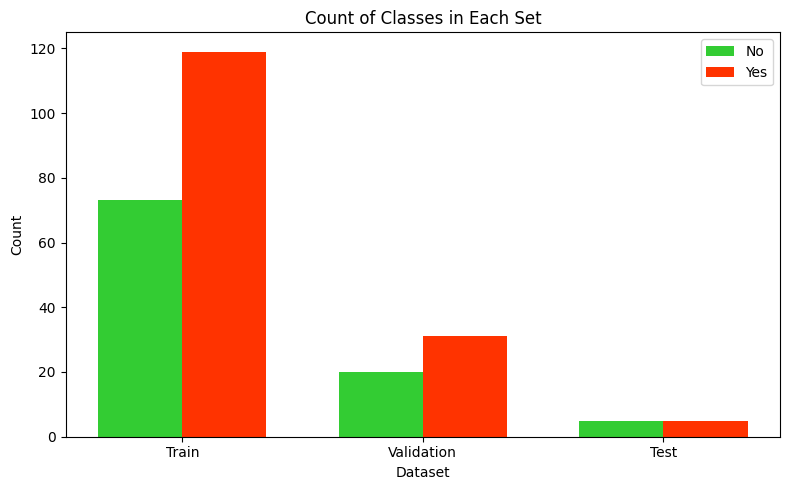

In [12]:
import matplotlib.pyplot as plt

sets = ['Train', 'Validation', 'Test']
yes_counts = [np.sum(y_train == 1), np.sum(y_val == 1), np.sum(y_test == 1)]
no_counts = [np.sum(y_train == 0), np.sum(y_val == 0), np.sum(y_test == 0)]

x = np.arange(len(sets))
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, no_counts, width, label='No', color='#33cc33')
plt.bar(x + width/2, yes_counts, width, label='Yes', color='#ff3300')

plt.xlabel('Dataset')
plt.ylabel('Count')
plt.title('Count of Classes in Each Set')
plt.xticks(x, sets)
plt.legend()
plt.tight_layout()
plt.show()

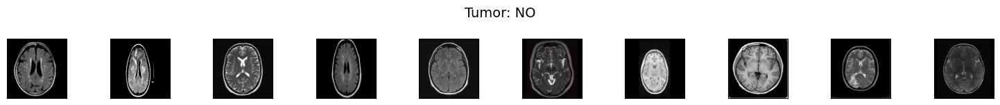

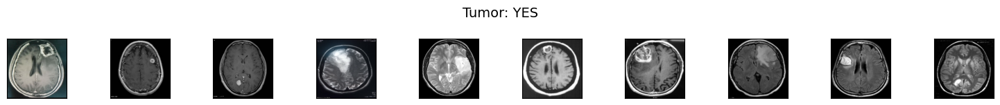

In [ ]:
def plot_samples(X, y, labels_dict, n=50):
    """
    Creates a gridplot for desired number of images (n) from the specified set
    """
    for index in range(len(labels_dict)):
        imgs = X[np.argwhere(y == index)][:n]
        cols = 10
        rows = max(1, int(np.ceil(len(imgs) / cols)))

        plt.figure(figsize=(15, 1.5 * rows))
        for c, img in enumerate(imgs):
            plt.subplot(rows, cols, c + 1)
            plt.imshow(img[0])
            plt.xticks([])
            plt.yticks([])
        plt.suptitle(f'Tumor: {labels_dict[index]}', fontsize=14)
        plt.tight_layout()
        plt.show()

plot_samples(X_train, y_train, labels, 10)

As you can see, images have different `width` and `height` and diffent size of "black corners". Since the image size for VGG-16 imput layer is `(224,224)` some wide images may look weird after resizing. Histogram of ratio distributions (`ratio = width/height`):

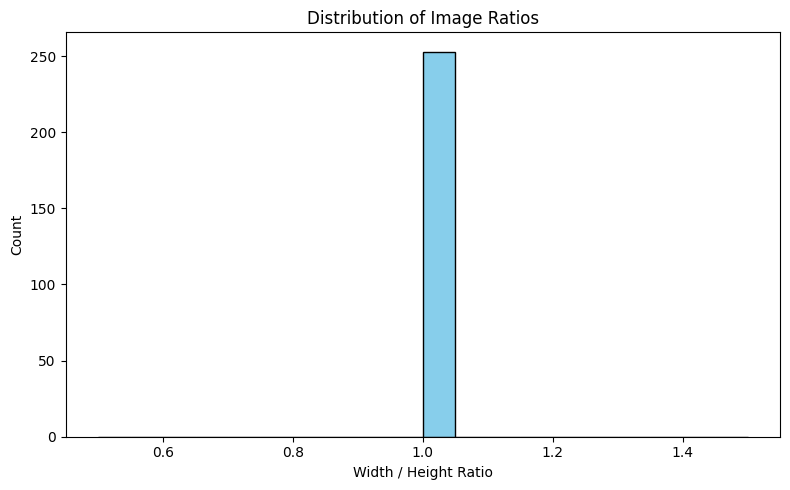

In [15]:
# Plot histogram showing distribution of image width-to-height ratios

RATIO_LIST = []
for dataset in (X_train, X_test, X_val):
    for img in dataset:
        RATIO_LIST.append(img.shape[1] / img.shape[0])

plt.figure(figsize=(8, 5))
plt.hist(RATIO_LIST, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Image Ratios')
plt.xlabel('Width / Height Ratio')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

The first step of "normalization" would be to crop the brain out of the images. I used technique which was perfectly described in [pyimagesearch](https://www.pyimagesearch.com/2016/04/11/finding-extreme-points-in-contours-with-opencv/) blog and I highly suggest to looks deeper into it.

In [20]:
# Crop images using extreme contour points and optional pixel padding

def crop_imgs(set_name, add_pixels_value=0):
    """
    Finds the extreme points on the image and crops the rectangular area out of them
    """
    set_new = []
    for img in set_name:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # threshold the image and clean noise
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # find contours and select the largest
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        if len(cnts) == 0:
            set_new.append(img)
            continue
        c = max(cnts, key=cv2.contourArea)

        # find extreme points
        extLeft = tuple(c[c[:, :, 0].argmin()][0])
        extRight = tuple(c[c[:, :, 0].argmax()][0])
        extTop = tuple(c[c[:, :, 1].argmin()][0])
        extBot = tuple(c[c[:, :, 1].argmax()][0])

        # apply cropping with optional padding
        ADD_PIXELS = add_pixels_value
        y1 = max(extTop[1] - ADD_PIXELS, 0)
        y2 = min(extBot[1] + ADD_PIXELS, img.shape[0])
        x1 = max(extLeft[0] - ADD_PIXELS, 0)
        x2 = min(extRight[0] + ADD_PIXELS, img.shape[1])

        new_img = img[y1:y2, x1:x2].copy()
        set_new.append(new_img)

    return set_new

Let's look at example what this function will do with MRI scans:

In [17]:
# Process a brain tumor image to visualize contour and crop based on extreme points

img = cv2.imread('brain_tumor_dataset/yes/Y108.jpg')
img = cv2.resize(img, dsize=IMG_SIZE, interpolation=cv2.INTER_CUBIC)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)

# Threshold and clean noise
thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.dilate(thresh, None, iterations=2)

# Find largest contour
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

# Get extreme points
extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])

# Draw contour
img_cnt = cv2.drawContours(img.copy(), [c], -1, (0, 255, 255), 4)

# Mark extreme points
img_pnt = img_cnt.copy()
img_pnt = cv2.circle(img_pnt, extLeft, 8, (0, 0, 255), -1)
img_pnt = cv2.circle(img_pnt, extRight, 8, (0, 255, 0), -1)
img_pnt = cv2.circle(img_pnt, extTop, 8, (255, 0, 0), -1)
img_pnt = cv2.circle(img_pnt, extBot, 8, (255, 255, 0), -1)

# Safe cropping
ADD_PIXELS = 0
y1 = max(extTop[1] - ADD_PIXELS, 0)
y2 = min(extBot[1] + ADD_PIXELS, img.shape[0])
x1 = max(extLeft[0] - ADD_PIXELS, 0)
x2 = min(extRight[0] + ADD_PIXELS, img.shape[1])

new_img = img[y1:y2, x1:x2].copy()

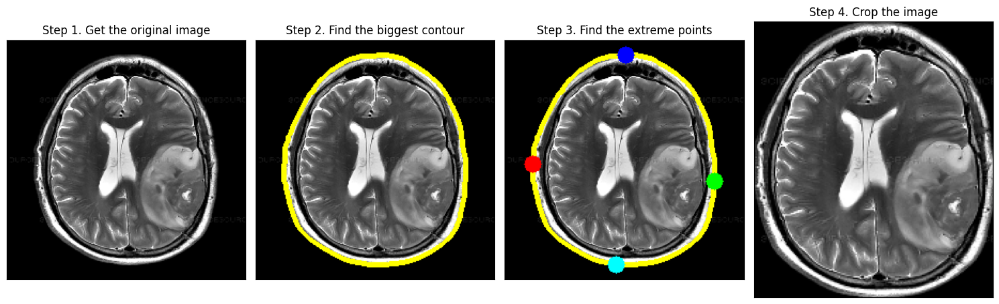

In [18]:
# Display each step of the image cropping process side-by-side

plt.figure(figsize=(15, 6))

plt.subplot(141)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.title('Step 1. Get the original image')

plt.subplot(142)
plt.imshow(cv2.cvtColor(img_cnt, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.title('Step 2. Find the biggest contour')

plt.subplot(143)
plt.imshow(cv2.cvtColor(img_pnt, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.title('Step 3. Find the extreme points')

plt.subplot(144)
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.title('Step 4. Crop the image')

plt.tight_layout()
plt.show()

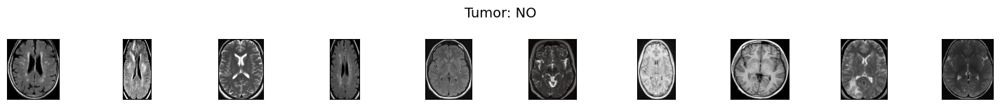

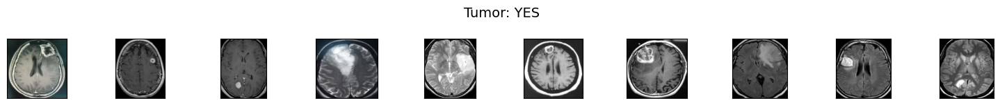

In [22]:
# Apply cropping to all image sets and visualize cropped training samples

X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

def plot_samples(X, y, labels_dict, n=50):
    """
    Creates a gridplot for desired number of images (n) from the specified set
    """
    for index in range(len(labels_dict)):
        # get indices where label matches current index
        idx = np.where(y == index)[0][:n]
        imgs = [X[i] for i in idx]

        cols = 10
        rows = max(1, int(np.ceil(len(imgs) / cols)))

        plt.figure(figsize=(15, 1.5 * rows))
        for c, img in enumerate(imgs):
            plt.subplot(rows, cols, c + 1)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
        plt.suptitle(f'Tumor: {labels_dict[index]}', fontsize=14)
        plt.tight_layout()
        plt.show()

plot_samples(X_train_crop, y_train, labels, 10)

In [23]:
# Save cropped images into corresponding TRAIN/VAL/TEST folders by class

def save_new_images(x_set, y_set, folder_name):
    for i, (img, imclass) in enumerate(zip(x_set, y_set)):
        label_folder = 'NO' if imclass == 0 else 'YES'
        path = os.path.join(folder_name, label_folder, f'{i}.jpg')
        cv2.imwrite(path, img)

# Create directory structure for cropped images
!mkdir -p TRAIN_CROP/YES TRAIN_CROP/NO TEST_CROP/YES TEST_CROP/NO VAL_CROP/YES VAL_CROP/NO

save_new_images(X_train_crop, y_train, folder_name='TRAIN_CROP/')
save_new_images(X_val_crop, y_val, folder_name='VAL_CROP/')
save_new_images(X_test_crop, y_test, folder_name='TEST_CROP/')

The next step would be resizing images to `(224,224)` and applying preprocessing needed for VGG-16 model input.

In [24]:
# Resize images and apply VGG16-compatible preprocessing

def preprocess_imgs(set_name, img_size):
    """
    Resize and apply VGG16 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input(img))
    return np.array(set_new)

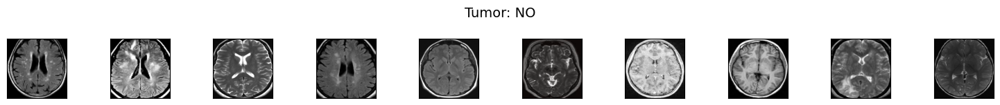

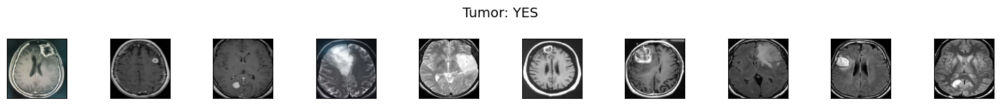

In [25]:
# Preprocess cropped images and plot sample training images

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Convert back to displayable format for plotting (undo VGG preprocessing)
def deprocess_vgg(imgs):
    imgs = imgs.copy()
    imgs[..., 0] += 103.939
    imgs[..., 1] += 116.779
    imgs[..., 2] += 123.68
    imgs = imgs[..., ::-1]  # BGR to RGB
    imgs = np.clip(imgs, 0, 255).astype(np.uint8)
    return imgs

X_train_disp = deprocess_vgg(X_train_prep)
plot_samples(X_train_disp, y_train, labels, 10)

# <a id='cnn'>4. CNN Model</a>


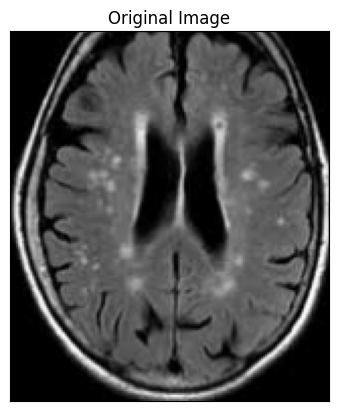

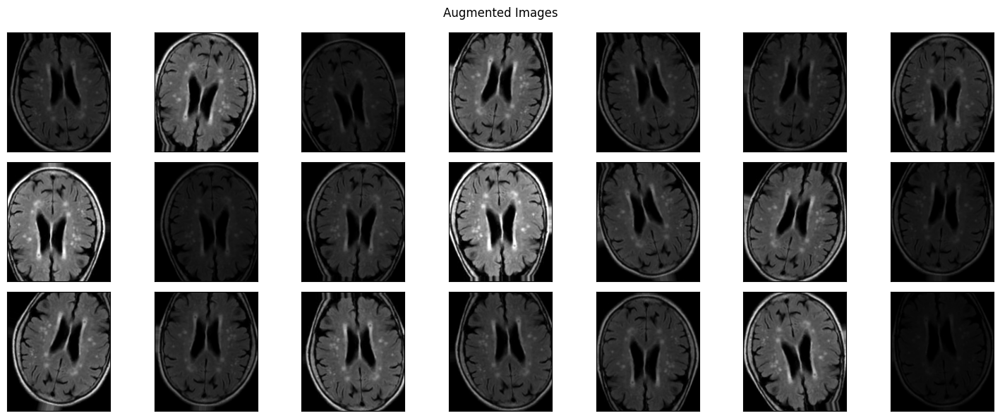

In [ ]:
# Generate augmented images, save to disk, and also plot them from memory

import os
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Create folder to save augmented previews
os.makedirs('preview', exist_ok=True)

demo_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    rescale=1./255,
    shear_range=0.05,
    brightness_range=[0.1, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

x = X_train_crop[0]
x = x.reshape((1,) + x.shape)

augmented_imgs = []
i = 0
for batch in demo_datagen.flow(x, batch_size=1, save_to_dir='preview', save_prefix='aug_img', save_format='jpg'):
    augmented_imgs.append(batch[0])
    i += 1
    if i >= 21:
        break

# Show the original image
plt.imshow(cv2.cvtColor(X_train_crop[0], cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

# Plot augmented images from memory
plt.figure(figsize=(15, 6))
for i, img in enumerate(augmented_imgs):
    plt.subplot(3, 7, i + 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.suptitle('Augmented Images')
plt.tight_layout()
plt.show()

In [27]:
!rm -rf preview/

### <a id='apply'>4.1.2. Apply</a>

In [29]:
# Create data generators for training and validation with augmentation and preprocessing

TRAIN_DIR = 'TRAIN_CROP/'
VAL_DIR = 'VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

Found 192 images belonging to 2 classes.
Found 51 images belonging to 2 classes.


In [31]:
# Load ResNet50 base model without top layer using custom weights


from keras.applications import ResNet50

resnet50_x = ResNet50(
    weights='imagenet',         # use built-in ImageNet weights
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)

94765736/94765736 [==============================] - 1s 0us/step


In [32]:
from keras.applications import InceptionV3, VGG16

inceptionV3 = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)

vgg = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)

58889256/58889256 [==============================] - 1s 0us/step


In [34]:
!pip install scikit-image

from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

  Using cached scikit_image-0.25.2-cp311-cp311-macosx_12_0_arm64.whl.metadata (14 kB)
  Using cached imageio-2.37.0-py3-none-any.whl.metadata (5.2 kB)
  Using cached lazy_loader-0.4-py3-none-any.whl.metadata (7.6 kB)
Using cached scikit_image-0.25.2-cp311-cp311-macosx_12_0_arm64.whl (13.2 MB)
Using cached imageio-2.37.0-py3-none-any.whl (315 kB)
Using cached lazy_loader-0.4-py3-none-any.whl (12 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.4/22.4 MB 70.2 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.3
    Uninstalling scipy-1.11.3:
      Successfully uninstalled scipy-1.11.3

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [38]:
import os
import sys
import math
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import cv2
from PIL import Image
from tqdm import tqdm
from random import shuffle
from collections import Counter
from itertools import chain
from os import listdir
from os.path import isfile, join

from scipy import ndimage

from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import umap
import tensorflow as tf
from keras import backend as K
from keras.models import Model, load_model, Sequential
from keras.layers import (
    Input, Conv2D, MaxPooling2D, Conv2DTranspose,
    Activation, Dropout, Flatten, Dense, Lambda, concatenate
)
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.utils import to_categorical

# VGG-16 

1/1 [==============================] - 0s 154ms/step


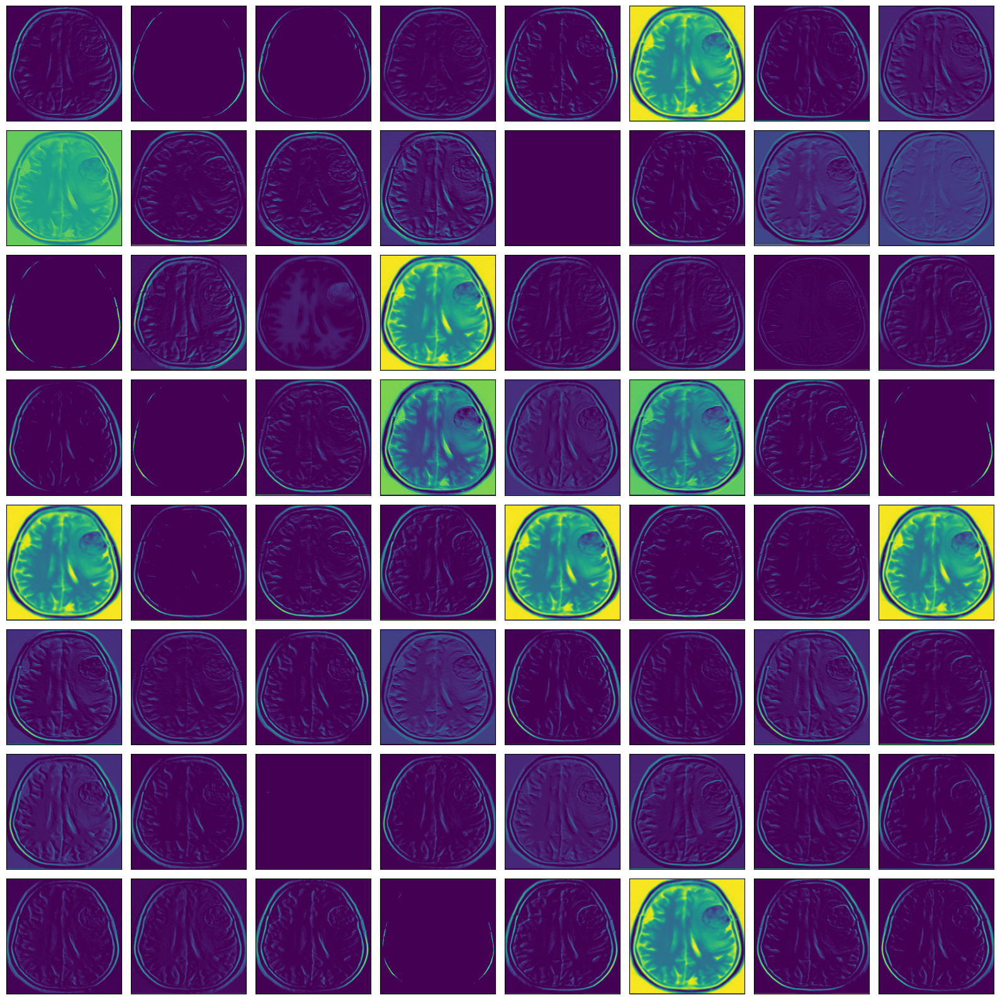

In [39]:
# Plot feature map of the first convolutional layer from VGG16 for a selected image

from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot as plt
from numpy import expand_dims

# Load base VGG16 model
base_model = VGG16()

# Redefine model to output from first conv layer (block1_conv1)
model = Model(inputs=base_model.inputs, outputs=base_model.get_layer('block1_conv1').output)

# Prepare input image
img = img_to_array(X_val_prep[43])
img = expand_dims(img, axis=0)
img = preprocess_input(img)

# Generate feature map
feature_maps = model.predict(img)

# Plot all 64 feature maps in an 8x8 grid
plt.figure(figsize=(16, 16))
square = 8
for i in range(square * square):
    ax = plt.subplot(square, square, i + 1)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')
plt.tight_layout()
plt.show()

In [41]:

from keras.optimizers.legacy import Adam

NUM_CLASSES = 1

vgg16 = Sequential()
vgg16.add(vgg)  # VGG16 base model
vgg16.add(layers.Dropout(0.3))
vgg16.add(layers.Flatten())
vgg16.add(layers.Dropout(0.5))
vgg16.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

# Freeze convolutional base
vgg16.layers[0].trainable = False

# Compile using legacy Adam optimizer
vgg16.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=0.0003),
    metrics=['accuracy']
)

vgg16.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 dropout_2 (Dropout)         (None, 7, 7, 512)         0         
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_3 (Dropout)         (None, 25088)             0         
                                                                 
 dense_1 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 14739777 (56.23 MB)
Trainable params: 25089 (98.00 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


1/1 [==============================] - 0s 271ms/step


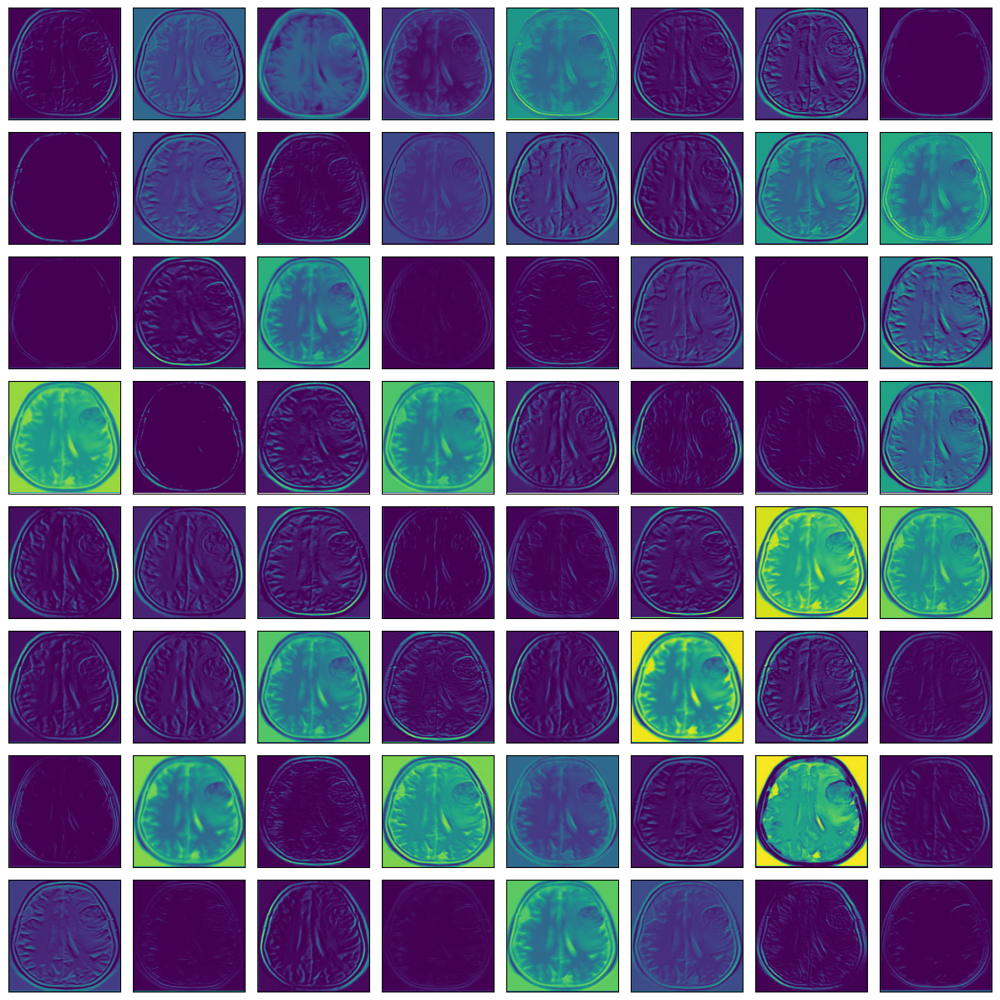

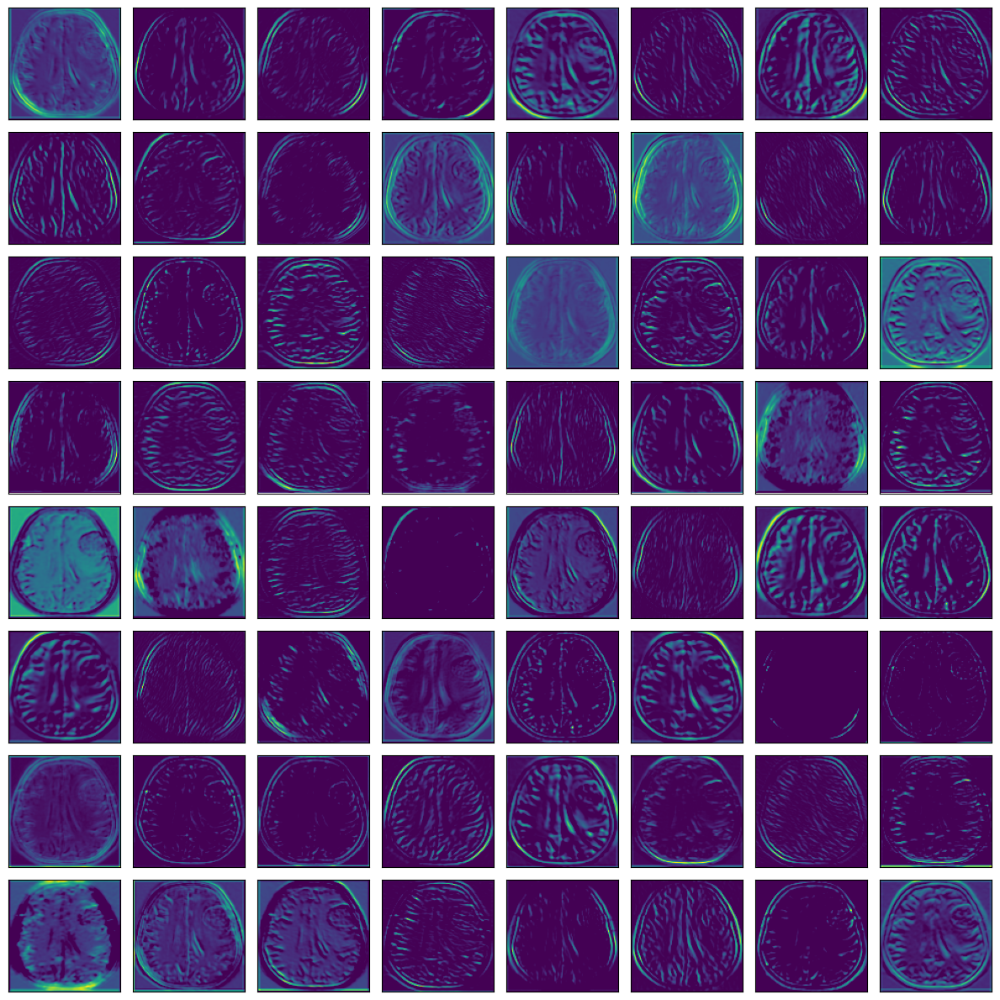

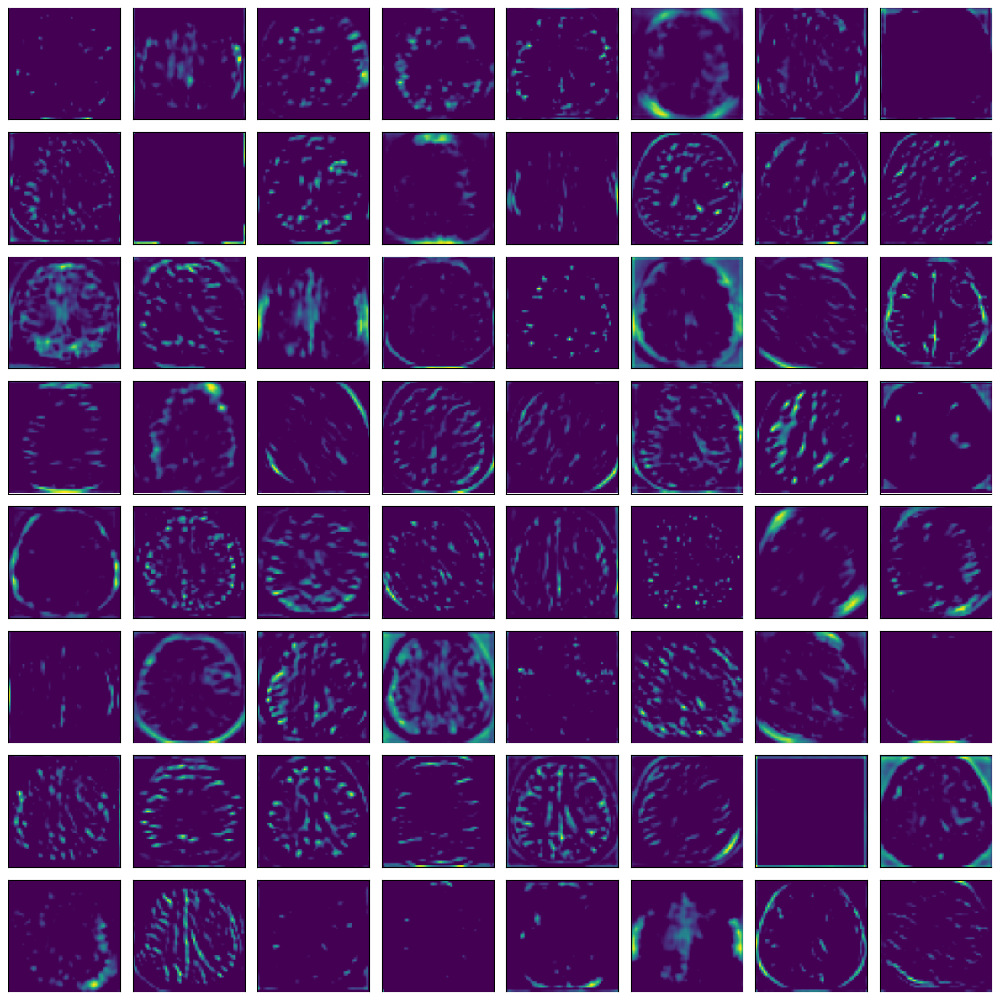

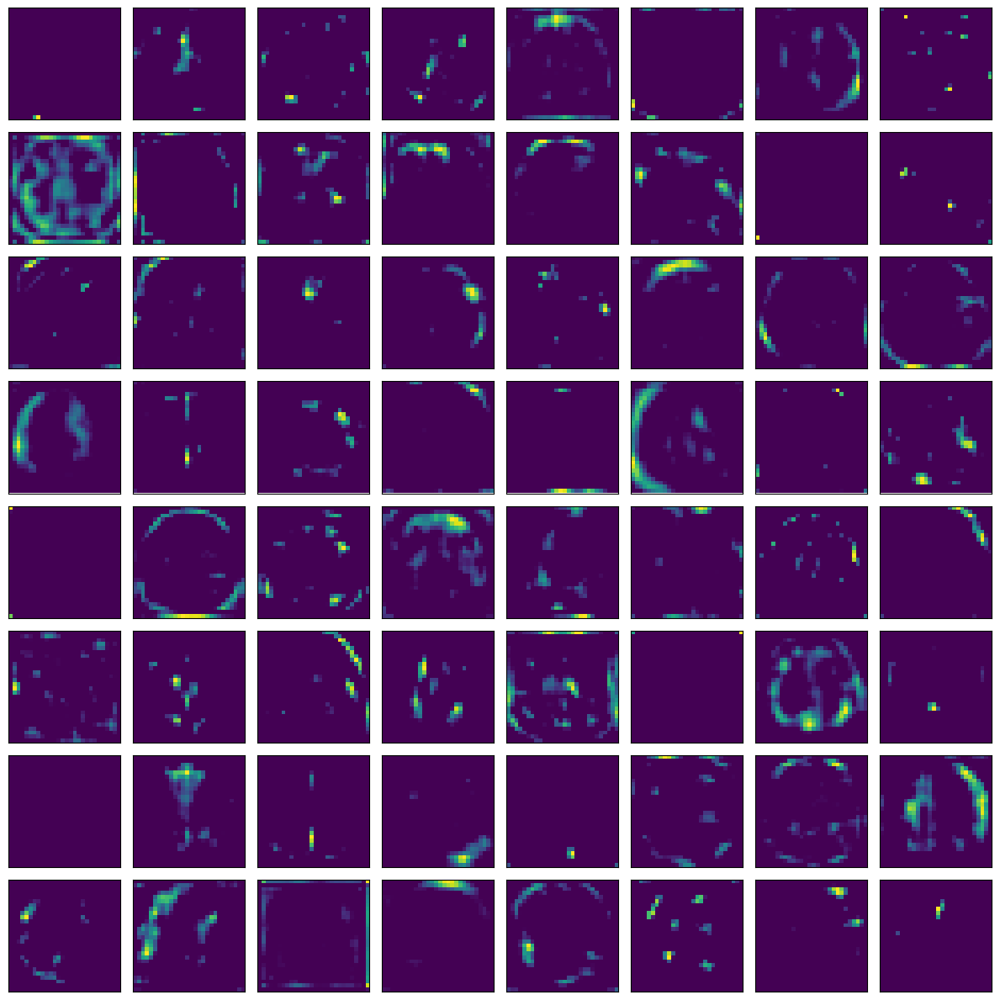

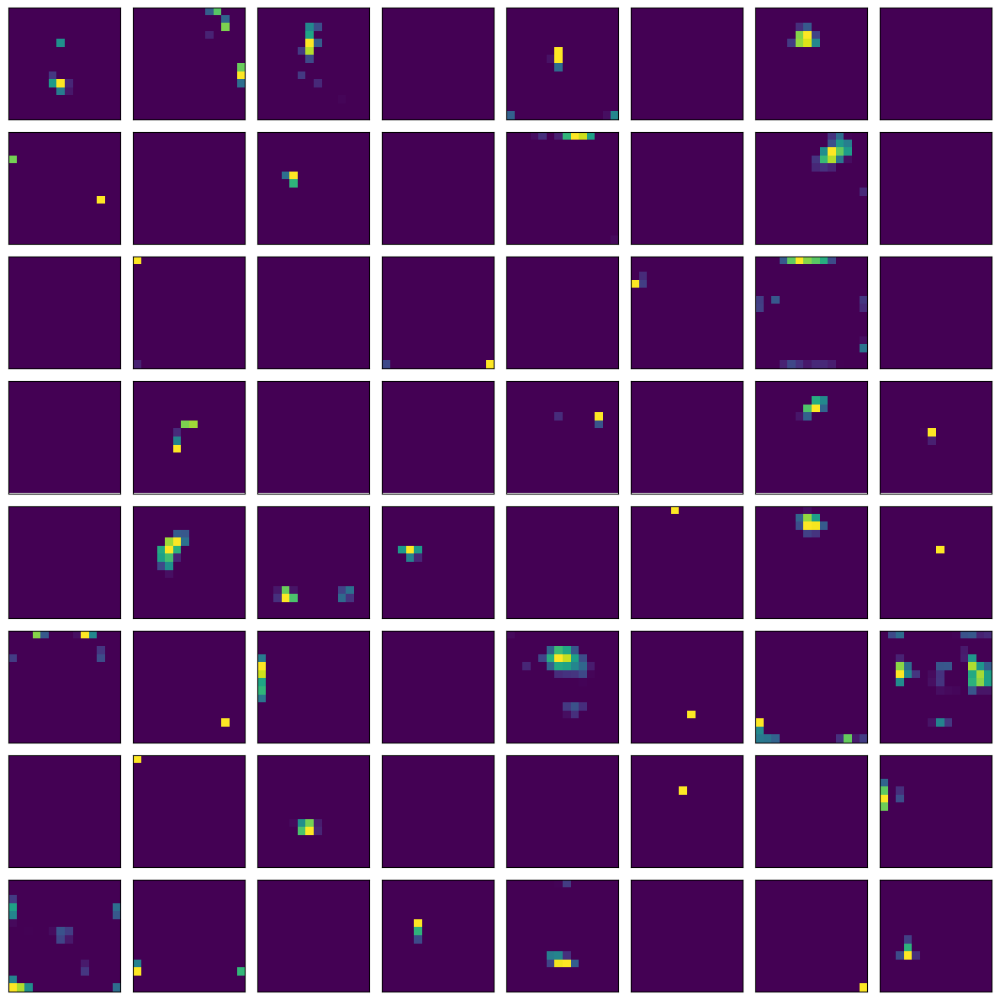

In [42]:
# Visualize feature maps from selected blocks of the VGG16 model for a given image

from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import img_to_array
from keras.models import Model
import matplotlib.pyplot as plt
from numpy import expand_dims

# Load VGG16 model
model = VGG16()

# Select layers to extract feature maps from (after each block)
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)

# Prepare input image
img = img_to_array(X_val_prep[43])
img = expand_dims(img, axis=0)
img = preprocess_input(img)

# Get feature maps
feature_maps = model.predict(img)

# Plot feature maps from each block
square = 8
for fmap in feature_maps:
    plt.figure(figsize=(12, 12))
    for i in range(square * square):
        ax = plt.subplot(square, square, i + 1)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(fmap[0, :, :, i], cmap='viridis')
    plt.tight_layout()
    plt.show()

In [45]:
import time

# Calculate steps dynamically based on generator size
train_steps = train_generator.samples // train_generator.batch_size
val_steps = validation_generator.samples // validation_generator.batch_size

start = time.time()

vgg16_history = vgg16.fit(
    train_generator,
    steps_per_epoch=train_steps,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=val_steps,
)

end = time.time()
print(f"Training time: {end - start:.2f} seconds")

Epoch 1/20
6/6 [==============================] - 115s 22s/step - loss: 4.3071 - accuracy: 0.6094 - val_loss: 2.4216 - val_accuracy: 0.7500
Epoch 2/20
6/6 [==============================] - 90s 15s/step - loss: 4.3436 - accuracy: 0.6406 - val_loss: 1.1323 - val_accuracy: 0.8750
Epoch 3/20
6/6 [==============================] - 138s 25s/step - loss: 3.9165 - accuracy: 0.6927 - val_loss: 1.4561 - val_accuracy: 0.8750
Epoch 4/20
6/6 [==============================] - 89s 15s/step - loss: 4.3302 - accuracy: 0.6875 - val_loss: 2.7283 - val_accuracy: 0.7917
Epoch 5/20
6/6 [==============================] - 94s 16s/step - loss: 4.2405 - accuracy: 0.6615 - val_loss: 2.7946 - val_accuracy: 0.7917
Epoch 6/20
6/6 [==============================] - 92s 16s/step - loss: 2.9816 - accuracy: 0.7240 - val_loss: 2.7187 - val_accuracy: 0.8333
Epoch 7/20
6/6 [==============================] - 140s 26s/step - loss: 3.1102 - accuracy: 0.7604 - val_loss: 1.9175 - val_accuracy: 0.8750
Epoch 8/20
6/6 [========

## Calculate Metric

1/1 [==============================] - 1s 1s/step
Validation Accuracy: 0.8627
Test Accuracy: 0.9000


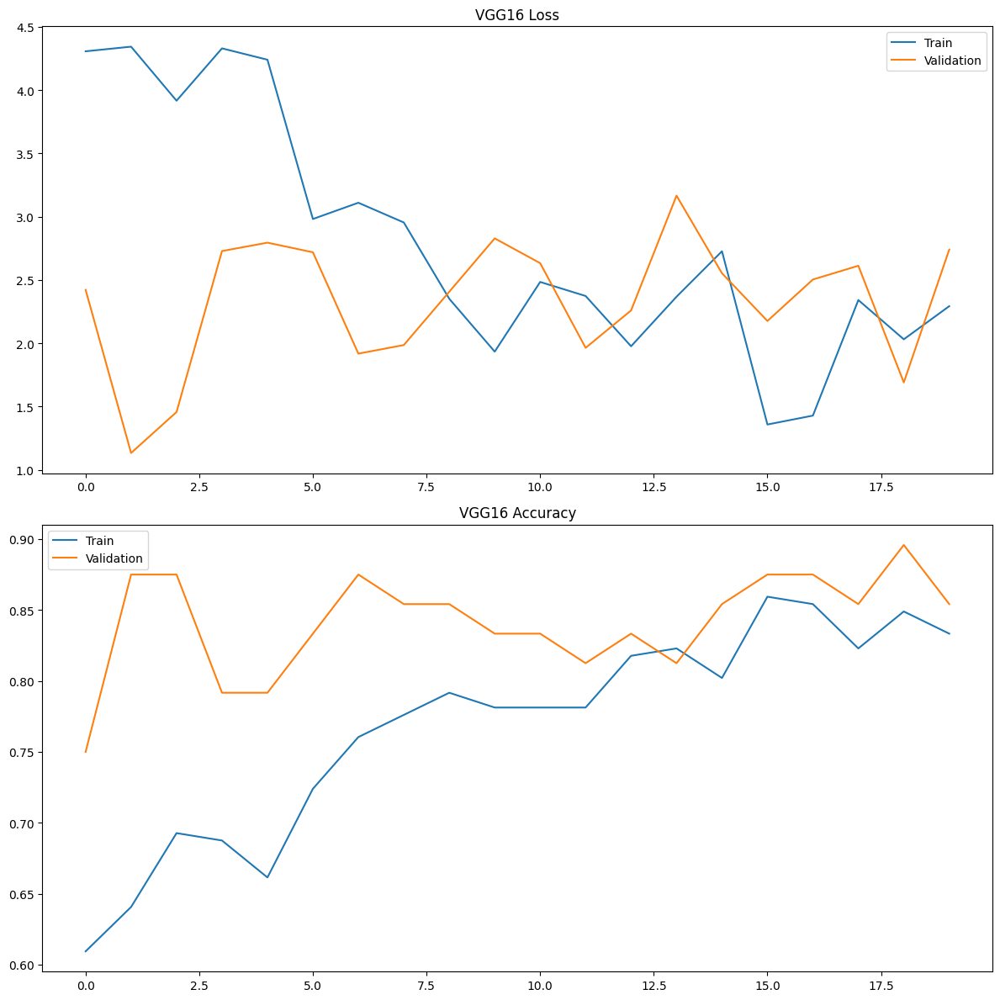

In [46]:
# Evaluate VGG16 model on validation and test sets and visualize training performance

from matplotlib import pyplot as plt

# Predict on test set
predictions = vgg16.predict(X_test_prep)
predictions = [1 if x > 0.5 else 0 for x in predictions]

# Evaluate model performance
_, val_acc = vgg16.evaluate(X_val_prep, y_val, verbose=0)
_, test_acc = vgg16.evaluate(X_test_prep, y_test, verbose=0)

print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

# Plot loss and accuracy
plt.figure(figsize=(12, 12))

# Loss plot
plt.subplot(211)
plt.title('VGG16 Loss')
plt.plot(vgg16_history.history['loss'], label='Train')
plt.plot(vgg16_history.history['val_loss'], label='Validation')
plt.legend()

# Accuracy plot
plt.subplot(212)
plt.title('VGG16 Accuracy')
plt.plot(vgg16_history.history['accuracy'], label='Train')
plt.plot(vgg16_history.history['val_accuracy'], label='Validation')
plt.legend()

plt.tight_layout()
plt.show()

In [48]:
# Evaluate binary classification model using accuracy, precision, recall, F1, kappa, AUC, and confusion matrix

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, cohen_kappa_score, roc_auc_score, confusion_matrix
)

print('Validation Accuracy: %.3f, Test Accuracy: %.3f' % (val_acc, test_acc))

# Accuracy
accuracy = accuracy_score(y_test, predictions)
print('Accuracy: %f' % accuracy)

# Precision
precision = precision_score(y_test, predictions)
print('Precision: %f' % precision)

# Recall
recall = recall_score(y_test, predictions)
print('Recall: %f' % recall)

# F1 Score
f1 = f1_score(y_test, predictions)
print('F1 Score: %f' % f1)

# Cohen's Kappa
kappa = cohen_kappa_score(y_test, predictions)
print("Cohen's Kappa: %f" % kappa)

# ROC AUC Score
auc = roc_auc_score(y_test, predictions)
print('ROC AUC: %f' % auc)

# Confusion Matrix
matrix = confusion_matrix(y_test, predictions)
print('Confusion Matrix:')
print(matrix)

Validation Accuracy: 0.863, Test Accuracy: 0.900
Accuracy: 0.900000
Precision: 1.000000
Recall: 0.800000
F1 Score: 0.888889
Cohen's Kappa: 0.800000
ROC AUC: 0.900000
Confusion Matrix:
[[5 0]
 [1 4]]


# InceptionV3

In [49]:
from keras.models import Sequential
from keras import layers
from keras.optimizers.legacy import Adam

NUM_CLASSES = 1

inception_v3 = Sequential()
inception_v3.add(inceptionV3)  # preloaded InceptionV3 base model
inception_v3.add(layers.Dropout(0.3))
inception_v3.add(layers.Flatten())
inception_v3.add(layers.Dropout(0.5))
inception_v3.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

# Freeze base model
inception_v3.layers[0].trainable = False

# Compile model with legacy Adam optimizer (recommended on M1/M2 Mac)
inception_v3.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=0.0003),
    metrics=['accuracy']
)

inception_v3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 dropout_4 (Dropout)         (None, 5, 5, 2048)        0         
                                                                 
 flatten_2 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_5 (Dropout)         (None, 51200)             0         
                                                                 
 dense_2 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21853985 (83.37 MB)
Trainable params: 51201 (200.00 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [50]:
# Train InceptionV3 model using data generators and track training time

import time

# Dynamically calculate steps based on generator sizes
train_steps = train_generator.samples // train_generator.batch_size
val_steps = validation_generator.samples // validation_generator.batch_size

start = time.time()

inception_v3_history = inception_v3.fit(
    train_generator,
    steps_per_epoch=train_steps,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=val_steps,
)

end = time.time()
print(f"Training time: {end - start:.2f} seconds")

Epoch 1/20
6/6 [==============================] - 8s 1s/step - loss: 20.2642 - accuracy: 0.5365 - val_loss: 7.1199 - val_accuracy: 0.6875
Epoch 2/20
6/6 [==============================] - 6s 1s/step - loss: 18.4360 - accuracy: 0.5938 - val_loss: 4.9234 - val_accuracy: 0.7708
Epoch 3/20
6/6 [==============================] - 7s 1s/step - loss: 16.6691 - accuracy: 0.4688 - val_loss: 5.5456 - val_accuracy: 0.7083
Epoch 4/20
6/6 [==============================] - 7s 1s/step - loss: 11.3950 - accuracy: 0.6354 - val_loss: 2.8526 - val_accuracy: 0.7083
Epoch 5/20
6/6 [==============================] - 6s 1s/step - loss: 14.1220 - accuracy: 0.5365 - val_loss: 6.8576 - val_accuracy: 0.6667
Epoch 6/20
6/6 [==============================] - 7s 1s/step - loss: 11.7431 - accuracy: 0.5885 - val_loss: 7.6860 - val_accuracy: 0.6042
Epoch 7/20
6/6 [==============================] - 6s 1s/step - loss: 13.3634 - accuracy: 0.5469 - val_loss: 4.0690 - val_accuracy: 0.6875
Epoch 8/20
6/6 [==================

# RESNET50

In [51]:
# Build and compile a ResNet50-based binary classification model using legacy optimizer

from keras.models import Sequential
from keras import layers
from keras.optimizers.legacy import Adam

NUM_CLASSES = 1

resnet50 = Sequential()
resnet50.add(resnet50_x)  # preloaded ResNet50 base model
resnet50.add(layers.Dropout(0.3))
resnet50.add(layers.Flatten())
resnet50.add(layers.Dropout(0.5))
resnet50.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

# Freeze base model
resnet50.layers[0].trainable = False

# Compile model with legacy Adam optimizer (for M1/M2 compatibility)
resnet50.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=0.0003),
    metrics=['accuracy']
)

resnet50.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 dropout_6 (Dropout)         (None, 7, 7, 2048)        0         
                                                                 
 flatten_3 (Flatten)         (None, 100352)            0         
                                                                 
 dropout_7 (Dropout)         (None, 100352)            0         
                                                                 
 dense_3 (Dense)             (None, 1)                 100353    
                                                                 
Total params: 23688065 (90.36 MB)
Trainable params: 100353 (392.00 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [52]:
# Train ResNet50 model using data generators and measure training time

import time

# Dynamically calculate steps based on generator sizes
train_steps = train_generator.samples // train_generator.batch_size
val_steps = validation_generator.samples // validation_generator.batch_size

start = time.time()

resnet50_history = resnet50.fit(
    train_generator,
    steps_per_epoch=train_steps,
    epochs=20,  # you can increase this after verifying
    validation_data=validation_generator,
    validation_steps=val_steps,
)

end = time.time()
print(f"Training time: {end - start:.2f} seconds")

Epoch 1/20
6/6 [==============================] - 16s 3s/step - loss: 1.6805 - accuracy: 0.5573 - val_loss: 0.4354 - val_accuracy: 0.8125
Epoch 2/20
6/6 [==============================] - 34s 6s/step - loss: 0.9383 - accuracy: 0.7396 - val_loss: 0.7991 - val_accuracy: 0.7083
Epoch 3/20
6/6 [==============================] - 30s 5s/step - loss: 0.8224 - accuracy: 0.7865 - val_loss: 0.5195 - val_accuracy: 0.8542
Epoch 4/20
6/6 [==============================] - 20s 3s/step - loss: 0.6613 - accuracy: 0.8490 - val_loss: 1.4898 - val_accuracy: 0.6042
Epoch 5/20
6/6 [==============================] - 21s 4s/step - loss: 0.7834 - accuracy: 0.7656 - val_loss: 0.5573 - val_accuracy: 0.8750
Epoch 6/20
6/6 [==============================] - 18s 3s/step - loss: 0.7539 - accuracy: 0.8177 - val_loss: 0.6331 - val_accuracy: 0.8542
Epoch 7/20
6/6 [==============================] - 32s 6s/step - loss: 0.4536 - accuracy: 0.8542 - val_loss: 0.5772 - val_accuracy: 0.8125
Epoch 8/20
6/6 [==================

## <a id='perf'>4.3. Model Performance</a>

In [53]:
# Assign model training histories to unified variable names for comparison

history_1 = vgg16_history
history_2 = inception_v3_history
history_3 = resnet50_history

In [54]:
# Plot training loss and accuracy using matplotlib (fixed and separated for loss and acc)

import matplotlib.pyplot as plt
import numpy as np

def ModelGraphTrainingSummary(history, N, model_name):
    """
    Plot training and validation loss for a model
    """
    print("Generating loss plot...")

    plt.style.use("ggplot")
    plt.figure(figsize=(8, 6))
    plt.plot(np.arange(0, N), history.history["loss"], label="Train Loss")
    plt.plot(np.arange(0, N), history.history["val_loss"], label="Validation Loss")
    plt.title(f"Loss Curve - {model_name}")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")
    plt.tight_layout()
    plt.savefig(f"{model_name}_loss_plot.png")
    plt.close()

def ModelGraphTrainingSummaryAcc(history, N, model_name):
    """
    Plot training and validation accuracy for a model
    """
    print("Generating accuracy plot...")

    plt.style.use("ggplot")
    plt.figure(figsize=(8, 6))
    plt.plot(np.arange(0, N), history.history["accuracy"], label="Train Accuracy")
    plt.plot(np.arange(0, N), history.history["val_accuracy"], label="Validation Accuracy")
    plt.title(f"Accuracy Curve - {model_name}")
    plt.xlabel("Epoch #")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(f"{model_name}_accuracy_plot.png")
    plt.close()


--- Evaluating VGG-16 ---
Generating loss plot...
Generating accuracy plot...
2/2 [==============================] - 6s 2s/step
Validation Accuracy = 0.86


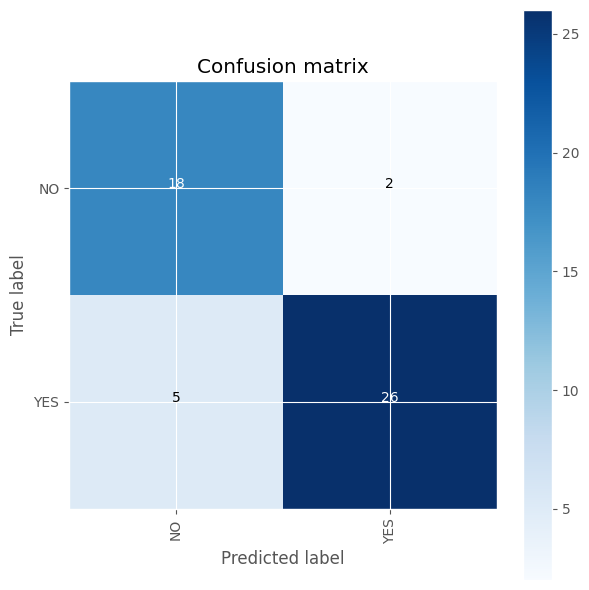


--- Evaluating Inception_v3 ---
Generating loss plot...
Generating accuracy plot...
2/2 [==============================] - 2s 369ms/step
Validation Accuracy = 0.63


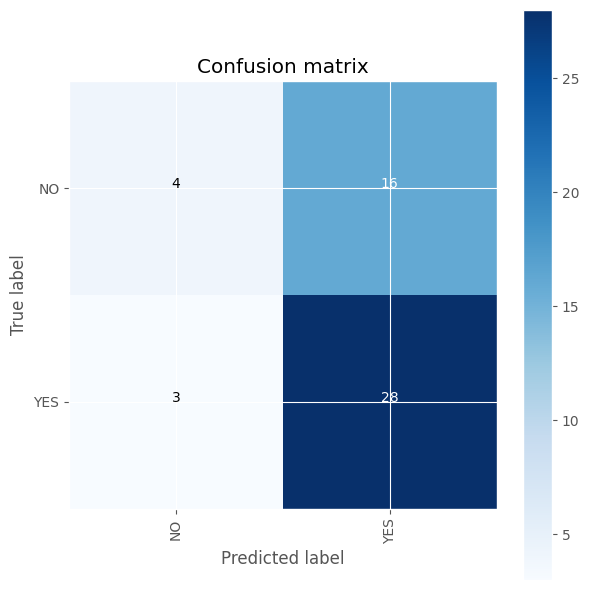


--- Evaluating Resnet ---
Generating loss plot...
Generating accuracy plot...


2/2 [==============================] - 3s 607ms/step
Validation Accuracy = 0.90


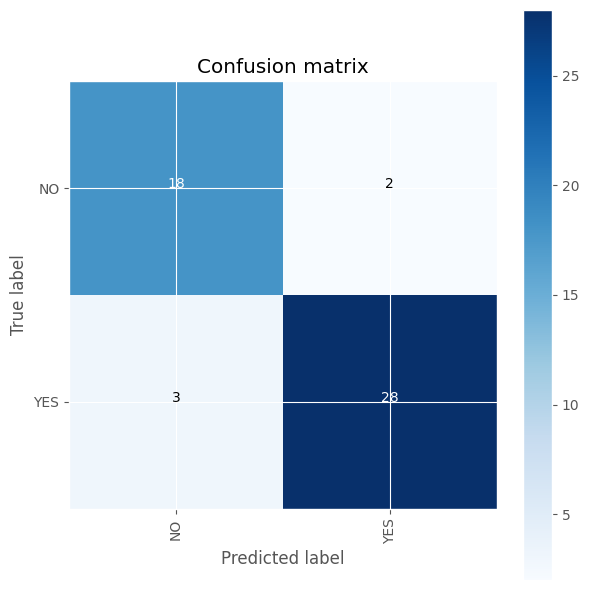

In [55]:
# Loop through all models, generate training plots, compute accuracy, and show confusion matrix

for x_model in [
    {'name': 'VGG-16', 'history': history_1, 'model': vgg16},
    {'name': 'Inception_v3', 'history': history_2, 'model': inception_v3},
    {'name': 'Resnet', 'history': history_3, 'model': resnet50}
]:
    print(f"\n--- Evaluating {x_model['name']} ---")

    # Plot training summary
    ModelGraphTrainingSummary(x_model['history'], 20, x_model['name'])  # assuming 20 epochs
    ModelGraphTrainingSummaryAcc(x_model['history'], 20, x_model['name'])

    # Predictions on validation set
    predictions = x_model['model'].predict(X_val_prep)
    predictions = [1 if x > 0.5 else 0 for x in predictions]

    # Accuracy
    accuracy = accuracy_score(y_val, predictions)
    print(f'Validation Accuracy = {accuracy:.2f}')

    # Confusion matrix
    confusion_mtx = confusion_matrix(y_val, predictions)
    class_names = [label for _, label in sorted(labels.items())]  # class 0 -> 'NO', class 1 -> 'YES'
    plot_confusion_matrix(confusion_mtx, classes=class_names, normalize=False)

In [57]:
# Clean up temporary folders and save trained models

import shutil

# Remove dataset directories if they exist
for folder in ['TRAIN', 'TEST', 'VAL', 'TRAIN_CROP', 'TEST_CROP', 'VAL_CROP']:
    shutil.rmtree(folder, ignore_errors=True)

# Save trained models
vgg16.save('VGG_model.h5')
inception_v3.save('inception_v3.h5')
resnet50.save('resnet50.h5')